In [ ]:
import os
import shutil
import random
import torch
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision import datasets, transforms
import numpy as np
import random
import torch
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
import PIL.ImageOps
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torchvision.utils
from torch.autograd import Variable
from torch import optim
import cv2
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from torchsummary import summary
%matplotlib inline

In [ ]:
# Define the path to the dataset folder
dataset_path = '/content/drive/MyDrive/lfw'


In [ ]:

# Define the path to your dataset folder
dataset_path = '/content/drive/MyDrive/lfw'

# Initialize variables to count persons with more than one image and total persons
persons_with_multiple_images = 0
total_persons = 0

# List all the subdirectories (person's names) in the dataset path
person_folders = os.listdir(dataset_path)

# Loop through the subdirectories (persons' folders)
for person in person_folders:
    # Create the full path to the person's folder
    person_folder = os.path.join(dataset_path, person)

    # List all image files in the person's folder
    image_files = os.listdir(person_folder)

    # Check if the person has more than one image
    if len(image_files) > 1:
        persons_with_multiple_images += 1

    total_persons += 1

# Print the number of persons with more than one image and the total number of persons
print(f"Total number of persons in the dataset: {total_persons}")
print(f"Number of persons with more than one image: {persons_with_multiple_images}")


Total number of persons in the dataset: 1722
Number of persons with more than one image: 1722


In [ ]:
# Loop through the subdirectories (persons' folders)
for person in person_folders:
    # Create the full path to the person's folder
    person_folder = os.path.join(dataset_path, person)

    # List all image files in the person's folder
    image_files = os.listdir(person_folder)

    # Check if the person has only one image
    if len(image_files) == 1:
        # Delete the folder and its contents
        shutil.rmtree(person_folder)

print("Folders with only one image removed from the original dataset.")

In [ ]:
# Initialize variables to count persons with more than one image and total persons
persons_with_multiple_images = 0
total_persons = 0
# Loop through the subdirectories (persons' folders)
for person in person_folders:
    # Create the full path to the person's folder
    person_folder = os.path.join(dataset_path, person)

    # List all image files in the person's folder
    image_files = os.listdir(person_folder)

    # Check if the person has more than one image
    if len(image_files) > 1:
        persons_with_multiple_images += 1

    total_persons += 1

# Print the number of persons with more than one image and the total number of persons
print(f"Total number of persons in the dataset: {total_persons}")
print(f"Number of persons with more than one image: {persons_with_multiple_images}")


Total number of persons in the dataset: 1722
Number of persons with more than one image: 1722


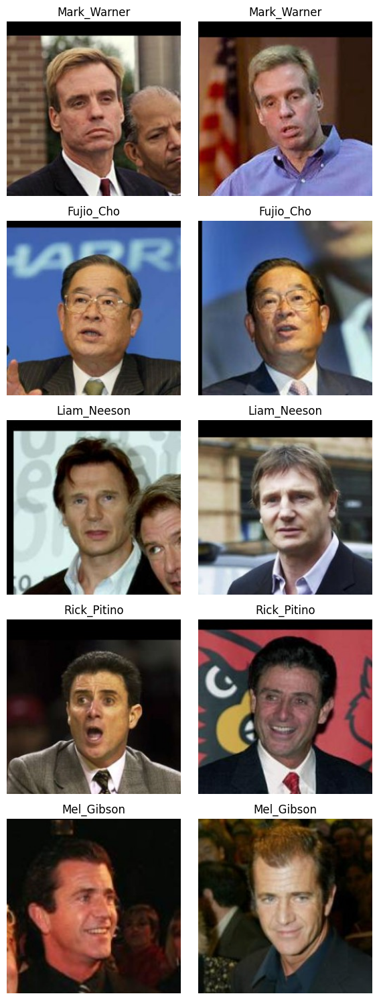

In [ ]:
# Select any five folders randomly
selected_folders = random.sample(person_folders, 5)

# Create a 5x2 subplot for displaying images
fig, axs = plt.subplots(5, 2, figsize=(6, 15))

for i, person in enumerate(selected_folders):
    # Create the full path to the person's folder
    person_folder = os.path.join(dataset_path, person)

    # List all image files in the person's folder
    image_files = os.listdir(person_folder)

    # Select any two images randomly
    selected_images = random.sample(image_files, 2)

    for j, image_file in enumerate(selected_images):
        # Create the full path to the image file
        image_path = os.path.join(person_folder, image_file)

        # Open the image
        img = Image.open(image_path)

        # Add the person's name as a title to the subplot
        axs[i, j].set_title(person)
        axs[i, j].imshow(img)
        axs[i, j].axis('off')

# Adjust the layout and show the subplots
plt.tight_layout()
plt.show()

In [ ]:
# List all the subdirectories (person's names) in the dataset path
person_folders = os.listdir(dataset_path)

# Shuffle the person_folders randomly
random.shuffle(person_folders)

# Calculate the total number of persons in the dataset
total_persons = len(person_folders)

# Define the proportions for the train, validation, and test sets
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Calculate the number of persons for each set
train_count = int(train_ratio * total_persons)
val_count = int(val_ratio * total_persons)
test_count = total_persons - train_count - val_count

# Split the person_folders into train, validation, and test sets
train_persons = person_folders[:train_count]
val_persons = person_folders[train_count:train_count + val_count]
test_persons = person_folders[train_count + val_count:]

# Print the number of persons in each set
print(f"Number of persons in the train set: {len(train_persons)}")
print(f"Number of persons in the validation set: {len(val_persons)}")
print(f"Number of persons in the test set: {len(test_persons)}")

Number of persons in the train set: 1205
Number of persons in the validation set: 344
Number of persons in the test set: 173


In [ ]:
# Define the paths for train, val, and test
train_path = '/content/drive/MyDrive/lfw_train'
val_path = '/content/drive/MyDrive/lfw_val'
test_path = '/content/drive/MyDrive/lfw_test'


In [ ]:
# Define the paths for train, val, and test
train_path = '/content/drive/MyDrive/lfw_train'
val_path = '/content/drive/MyDrive/lfw_val'
test_path = '/content/drive/MyDrive/lfw_test'

# Create the directories for train, val, and test if they don't exist
os.makedirs(train_path, exist_ok=True)
os.makedirs(val_path, exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# Move the person folders into their respective paths
for person in train_persons:
    source = os.path.join(dataset_path, person)
    destination = os.path.join(train_path, person)
    shutil.move(source, destination)

for person in val_persons:
    source = os.path.join(dataset_path, person)
    destination = os.path.join(val_path, person)
    shutil.move(source, destination)

for person in test_persons:
    source = os.path.join(dataset_path, person)
    destination = os.path.join(test_path, person)
    shutil.move(source, destination)

In [ ]:
# Count the number of person folders in each directory
train_persons_count = len(os.listdir(train_path))
val_persons_count = len(os.listdir(val_path))
test_persons_count = len(os.listdir(test_path))

# Print the number of person folders in each set
print(f"Number of person folders in the train set: {train_persons_count}")
print(f"Number of person folders in the validation set: {val_persons_count}")
print(f"Number of person folders in the test set: {test_persons_count}")

Number of person folders in the train set: 1205
Number of person folders in the validation set: 344
Number of person folders in the test set: 173


In [ ]:
def count_images_in_directory(directory):
    return sum([len(files) for root, dirs, files in os.walk(directory)])

# Count the number of images in each directory
train_image_count = count_images_in_directory(train_path)
val_image_count = count_images_in_directory(val_path)
test_image_count = count_images_in_directory(test_path)

# Print the number of images in each set
print(f"Number of images in the train set: {train_image_count}")
print(f"Number of images in the validation set: {val_image_count}")
print(f"Number of images in the test set: {test_image_count}")

Number of images in the train set: 6635
Number of images in the validation set: 1721
Number of images in the test set: 962


In [ ]:
# Create datasets for each set
train_dataset = datasets.ImageFolder(root=train_path)
val_dataset = datasets.ImageFolder(root=val_path)
test_dataset = datasets.ImageFolder(root=test_path)

In [ ]:
class SiameseNetworkDataset(Dataset):
    def __init__(self,imageFolderDataset,transform=None):
        self.imageFolderDataset = imageFolderDataset
        self.transform = transform

    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)

        should_get_same_class = random.randint(0,1)
        if should_get_same_class:
            while True:
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] == img1_tuple[1]:
                    break
        else:

            while True:
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] != img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_tuple[1] != img0_tuple[1])], dtype=np.float32))

    def __len__(self):
        return len(self.imageFolderDataset.imgs)

In [ ]:
# Define a face detector using OpenCV's pre-trained Haar Cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def face_centered_crop(img):
    # Convert the PIL image to a NumPy array
    img_np = np.array(img)

    # Detect faces in the image
    faces = face_cascade.detectMultiScale(img_np, scaleFactor=1.2, minNeighbors=5, minSize=(100, 100))

    if len(faces) == 0:
        # No face detected, perform a standard crop
        return transforms.CenterCrop(224)(img)

    # Get the first detected face
    x, y, w, h = faces[0]

    # Crop around the detected face
    img_cropped = img.crop((x, y, x + w, y + h))

    return img_cropped


In [ ]:
# Load a pre-trained ResNet-18 model
resnet18_model = models.resnet18(pretrained=True)

# Remove the classification (fully connected) layer
resnet18_model = nn.Sequential(*list(resnet18_model.children())[:-1])


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 83.3MB/s]


In [ ]:
# Load a pre-trained MobileNetV2 model
mobilenetv2_model = models.mobilenet_v2(pretrained=True)

# Remove the fully connected (classifier) layer
mobilenetv2_model = mobilenetv2_model.features


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 62.3MB/s]


In [ ]:
# Load a pre-trained MobileNetV2 model
mobilenetv2_model = models.mobilenet_v2(pretrained=True)

# Remove the fully connected layers
mobilenetv2_model = nn.Sequential(*list(mobilenetv2_model.children())[:-1])


# Add a global average pooling layer to obtain a fixed-size feature vector
gap = nn.AdaptiveAvgPool2d(1)  # Output size of 1x1
mobilenetv2_model.add_module('GAP', gap)

# Ensure the model is set to evaluation mode
mobilenetv2_model.eval()

# Define a sample input with a size of (batch_size, num_channels, width, height)
input_size = (128, 128)
sample_input = torch.randn(1, 3, input_size[0], input_size[1])

# Forward pass your input images through the model
output = mobilenetv2_model(sample_input)
output.shape


# Forward pass the input through the feature extractor
#feature_maps = mobilenetv2_model(sample_input)

# Flatten the feature maps to get a feature vector
#feature_vector = feature_maps.view(feature_maps.size(0), -1)

# The 'feature_vector' is your feature representation
#print("Feature vector shape:", feature_vector.shape)

torch.Size([1, 1280, 1, 1])

In [ ]:
# This includes the augmentaions to be performed on the image, also ensuring that the image is resized as required by the model defined.
# Define the image transformations
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.RandomRotation(degrees=0),  # Randomly rotate the image within a small range
        transforms.ColorJitter(brightness=0.1, contrast=0.1),  # Random brightness and contrast adjustments
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet statistics
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
}

In [ ]:
# Create datasets for train, val, and test
train_siamese_dataset = SiameseNetworkDataset(train_dataset, transform=data_transforms['train'])
val_siamese_dataset = SiameseNetworkDataset(val_dataset, transform=data_transforms['val'])
test_siamese_dataset = SiameseNetworkDataset(test_dataset, transform=data_transforms['test'])

In [ ]:
# Define batch size
batch_size = 128  # Adjust as needed

# Create data loaders for train, validation, and test
train_loader = DataLoader(train_siamese_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_siamese_dataset, batch_size=batch_size)
test_loader = DataLoader(test_siamese_dataset, batch_size=batch_size)

In [ ]:
train_loader_length = len(train_loader)
val_loader_length = len(val_loader)
test_loader_length = len(test_loader)

print(f"Number of data loader batches in the train set: {train_loader_length}")
print(f"Number of data loader batches in the validation set: {val_loader_length}")
print(f"Number of data loader batches in the test set: {test_loader_length}")

Number of data loader batches in the train set: 52
Number of data loader batches in the validation set: 14
Number of data loader batches in the test set: 8


In [ ]:
# we can now look at the size of each batch in the dataloader
for _, batch in enumerate(train_loader):
    x_batch, y_batch, z_batch = batch[0], batch[1], batch[2]
    print(x_batch.shape, y_batch.shape, z_batch.shape)
    break


torch.Size([16, 3, 224, 224]) torch.Size([16, 3, 224, 224]) torch.Size([16, 1])


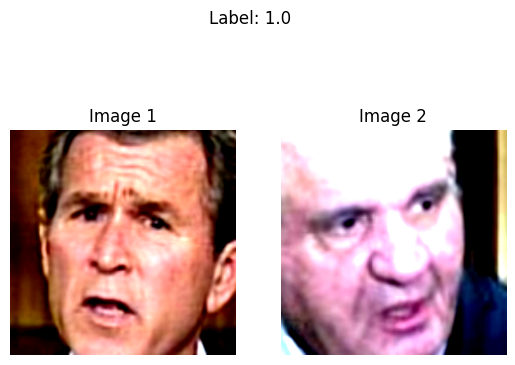

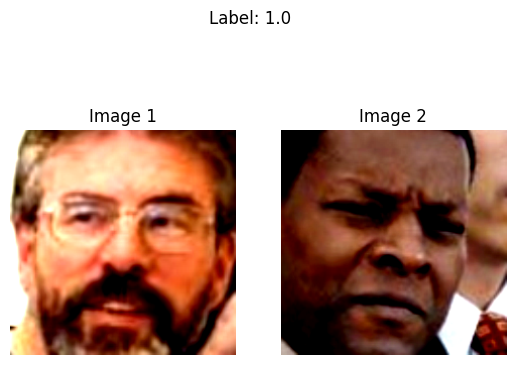

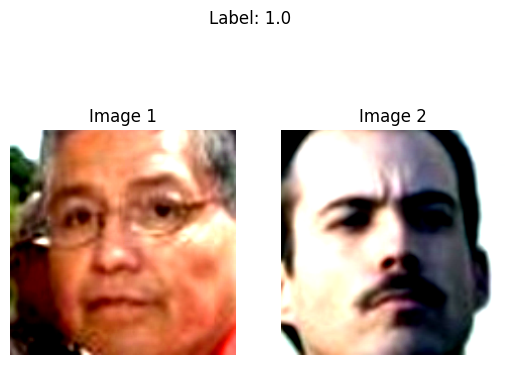

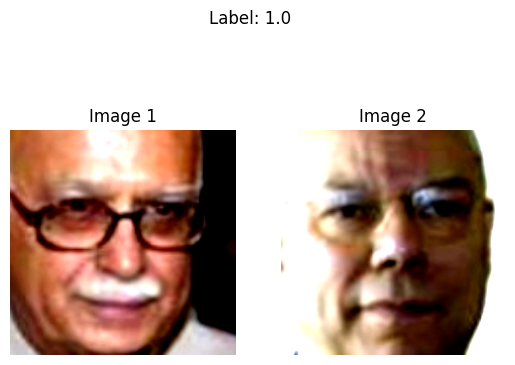

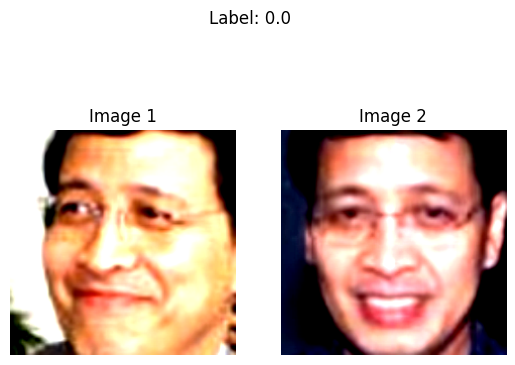

...

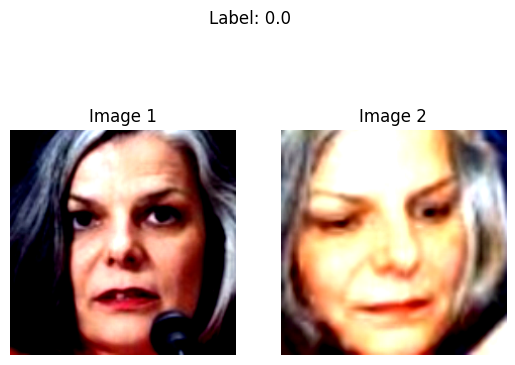

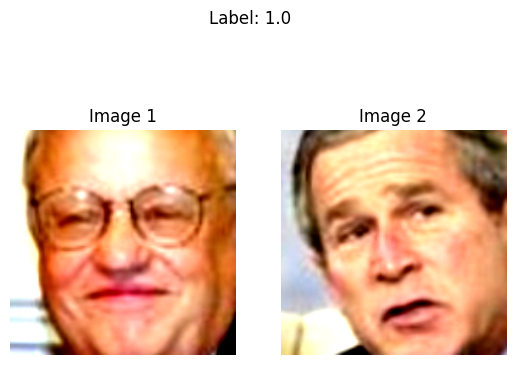

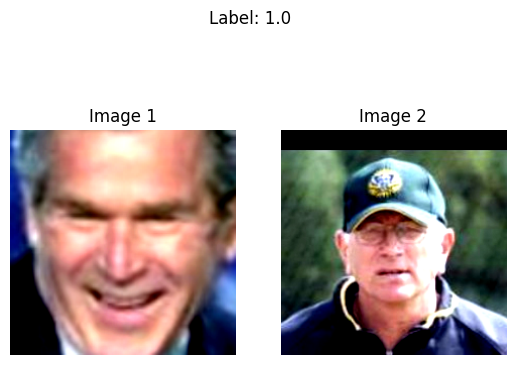

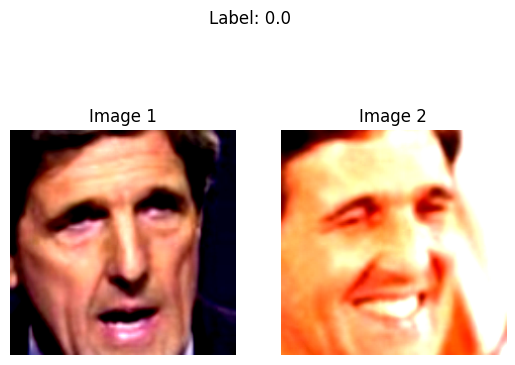

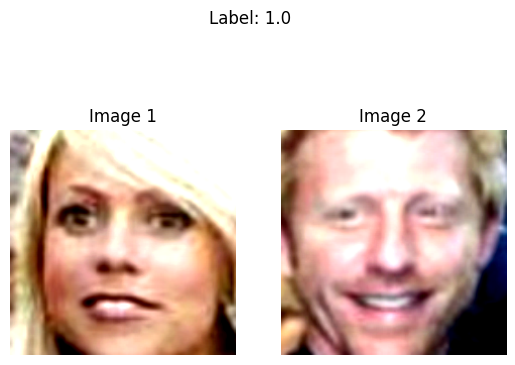

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate over the batch and visualize its content
for i in range(x_batch.shape[0]):
    img1 = x_batch[i]  # First image in the pair
    img2 = y_batch[i]  # Second image in the pair
    label = z_batch[i].item()  # Label for the pair

    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(np.transpose(img1.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.transpose(img2.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 2")
    plt.axis('off')

    plt.suptitle(f"Label: {label}")  # Common label outside both images
    plt.show()

In [ ]:
# This includes the augmentaions to be performed on the image
# ensuring that the image is resized as required by the model defined.
# Augmentaions like rotations random flip are applied
# Define the image transformations
# we aslo perform face deetction using haarcascade frontal face detection
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.RandomRotation(degrees=10),  # Randomly rotate the image within a small range
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),  # Random brightness and contrast adjustments
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet statistics
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),  # Resize to a larger size
        transforms.Lambda(face_centered_crop),  # Face-centered crop
        transforms.Resize(224),  # Resize to the final input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
}

In [ ]:
#create the Siamese Neural Network from scratch
class SiameseNetworkScratch(nn.Module):

    def __init__(self):
        super(SiameseNetworkScratch, self).__init__()

        # Setting up the Sequential of CNN Layers
        self.cnn1 = nn.Sequential(
            nn.Conv2d(3, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        # Setting up the Fully Connected Layers
        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # This function will be called for both images
        # It's output is used to determine the similiarity
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # In this function we pass in both images and obtain both vectors
        # which are returned
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

In [ ]:
class SiameseNetworkModel(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetworkModel, self).__init__()
        self.base_model = base_model
        self.fc = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.1),  # Dropout with a probability of 0.1 for regularisation
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.1),  # Dropout with a probability of 0.1 for regularisation
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.1),  # Dropout with a probability of 0.1 for regularisation
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.1),  # Dropout with a probability of 0.1 for regularisation
            nn.Linear(32, 16)
        )

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)

        return output1, output2

In [ ]:
class SiameseNetworkModel(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetworkModel, self).__init__()
        self.base_model = base_model

    def forward_one(self, x):
        x = self.base_model(x)
        x = x.view(x.size()[0], -1)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)

        return output1, output2

In [ ]:
# Define the Contrastive Loss Function
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
      # Calculate the euclidian distance
      euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)

      loss_similar=(1-label) * torch.pow(euclidean_distance, 2)

      loss_dissimilar=(label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
      # Calculate the contrastive loss
      loss_contrastive = torch.mean(loss_similar + loss_dissimilar)


      return loss_contrastive

In [ ]:
# Define the Contrastive Loss Function
class ContrastiveLossEuclidean(torch.nn.Module):
    def __init__(self, margin=0.07):
        super(ContrastiveLossEuclidean, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
      # Calculate the euclidian distance
      euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)

      loss_similar=(1-label) * torch.pow(euclidean_distance, 2)

      loss_dissimilar=(label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
      # Calculate the contrastive loss
      loss_contrastive = torch.mean(loss_similar + loss_dissimilar)

      return loss_contrastive


In [ ]:
class ContrastiveLossCosine(nn.Module):
    def __init__(self, margin=0.5):
        super(ContrastiveLossCosine, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        # Calculate cosine similarity
        cos_similarity = F.cosine_similarity(output1, output2)

        # Loss for similar pairs
        loss_similar = (1 - label) * 0.5 * (1 - cos_similarity)

        # Loss for dissimilar pairs
        loss_dissimilar = label * 0.5 * torch.clamp(cos_similarity - self.margin, min=0.0)

        # Total loss
        loss_contrastive = torch.mean(loss_similar + loss_dissimilar)
        return loss_contrastive

In [ ]:
model = SiameseNetworkModel(resnet18_model)

In [ ]:
criterion = ContrastiveLoss()
# criterion = ContrastiveLossCosine()
# criterion = ContrastiveLossEuclidean()
# Either Euclidean or Cosine Similarlty is used in the loss fucntion

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-5)

#optimizer = torch.optim.Adam(model.parameters(), lr = 0.0007, weight_decay=1e-4)

#optimizer = torch.optim.RMSProp(model.parameters(), lr = 0.00001)

#optimizer = torch.optim.SGD(model.parameters(), lr = 0.001, momentum=0.9,)

# Different Optimsers like Adam, RMSProp, Adagrad, SGD were experimented with
# and AdamW perfomrs well comapred to SGD & RMSProp

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR

optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

# Define the learning rate scheduler
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=0.001)


In [ ]:
from torch.optim.lr_scheduler import StepLR

# Defining an optisimer
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)
#optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-5)

# Define the learning rate scheduler
scheduler = StepLR(optimizer, step_size=2, gamma=0.1)


In [ ]:
# Check the summary for MobileNet
#summary(mobilenetv2_model, (3, 128, 128))

# Check the summary for MobileNet
# summary(resnet18_model, (3, 224, 224))
# Define the input sizes as a list of tuples
# input_size = [(3, 128, 128), (3, 128, 128)]

# Call the summary function with the list of input sizes
# summary(model, input_size)

Training - Epoch 0, Batch 0, Loss: 1.5842244625091553
Training - Epoch 0, Batch 1, Loss: 1.1278011798858643
Training - Epoch 0, Batch 2, Loss: 1.3477423191070557
Training - Epoch 0, Batch 3, Loss: 1.5279183387756348
Training - Epoch 0, Batch 4, Loss: 1.9849261045455933
Training - Epoch 0, Batch 5, Loss: 1.5657775402069092
Training - Epoch 0, Batch 6, Loss: 2.161405563354492
Training - Epoch 0, Batch 7, Loss: 1.4972667694091797
Training - Epoch 0, Batch 8, Loss: 1.7675771713256836
Training - Epoch 0, Batch 9, Loss: 1.0319955348968506
Training - Epoch 0, Batch 10, Loss: 2.183847427368164
Training - Epoch 0, Batch 11, Loss: 1.5163053274154663
Training - Epoch 0, Batch 12, Loss: 1.8840886354446411
Training - Epoch 0, Batch 13, Loss: 1.690567970275879
Training - Epoch 0, Batch 14, Loss: 1.5529197454452515
Training - Epoch 0, Batch 15, Loss: 1.4581708908081055
Training - Epoch 0, Batch 16, Loss: 2.1959805488586426
Training - Epoch 0, Batch 17, Loss: 1.4134111404418945
Training - Epoch 0, Bat

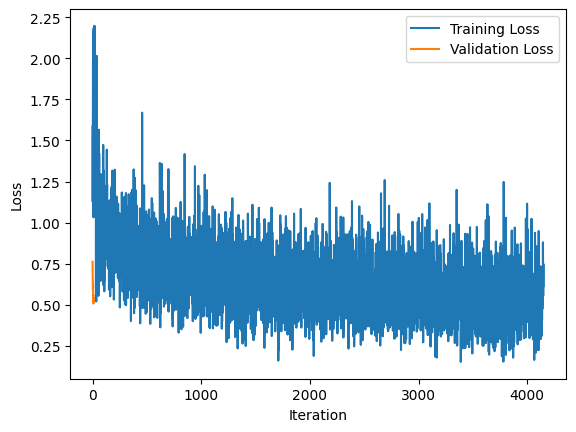

In [ ]:
# Lists to store training and validation loss and iteration numbers
train_loss_history = []
val_loss_history = []
iteration_number = 0
val_iteration_number = 0

best_val_loss = float('inf')  # Initialize best validation loss to positive infinity
best_model_path = 'best_siamese_model.pth'

# Training loop
for epoch in range(10):
    model.train()  # Set the model to training mode
    for i, data in enumerate(train_loader, 0):
        img0, img1, label = data
        optimizer.zero_grad()

        output1, output2 = model(img0, img1)
        loss_contrastive = criterion(output1, output2, label)
        loss_contrastive.backward()
        optimizer.step()

        print(f"Training - Epoch {epoch}, Batch {i}, Loss: {loss_contrastive.item()}")
        iteration_number += 1
        train_loss_history.append(loss_contrastive.item())

    # Validation loop
    model.eval()  # Set the model to evaluation mode
    # Update the learning rate at the end of each epoch
    scheduler.step()
    with torch.no_grad():
        total_val_loss = 0
        for i, data in enumerate(val_loader, 0):
            img0, img1, label = data
            output1, output2 = model(img0, img1)
            loss_contrastive = criterion(output1, output2, label)

            total_val_loss += loss_contrastive.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_loss_history.append(avg_val_loss)

        if avg_val_loss < best_val_loss:
            # Save the model with the best validation loss
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), best_model_path)

        print(f"Validation - Epoch {epoch}, Avg Loss: {avg_val_loss}")

    model.train()  # Set the model back to training mode

# Load the best model
model.load_state_dict(torch.load(best_model_path))
print("Best model loaded.")

# Plot training and validation loss
plt.plot(range(iteration_number), train_loss_history, label='Training Loss')
plt.plot(range(len(val_loss_history)), val_loss_history, label='Validation Loss')
plt.legend()
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Oct 17 18:26:26 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    47W / 400W |   5807MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

torch.Size([16, 3, 128, 128]) torch.Size([16, 3, 128, 128]) torch.Size([16, 1])


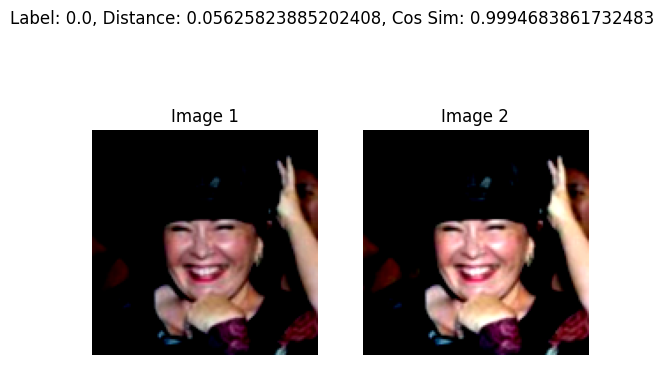

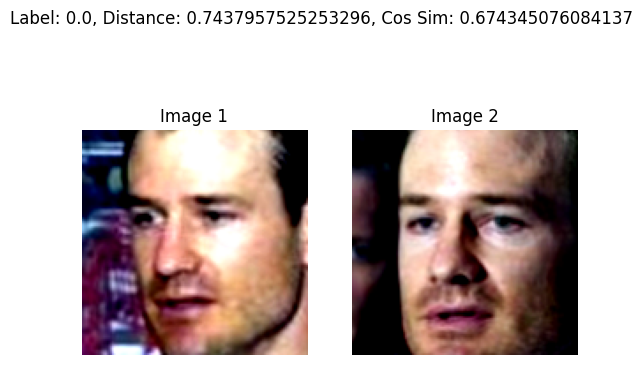

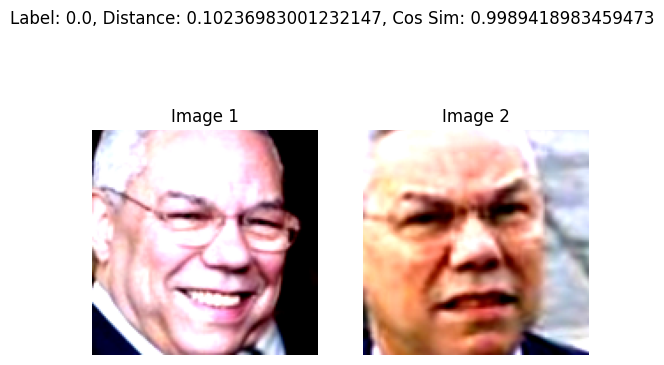

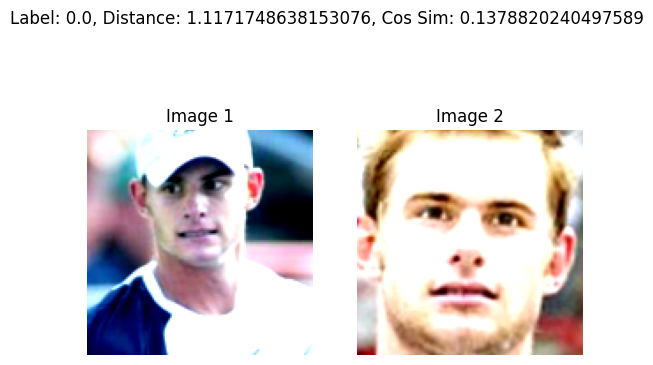

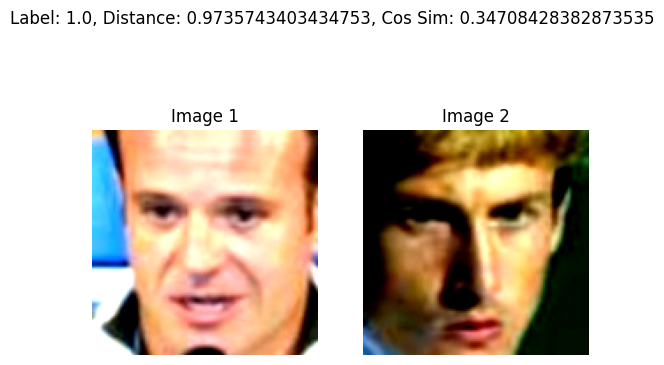

...

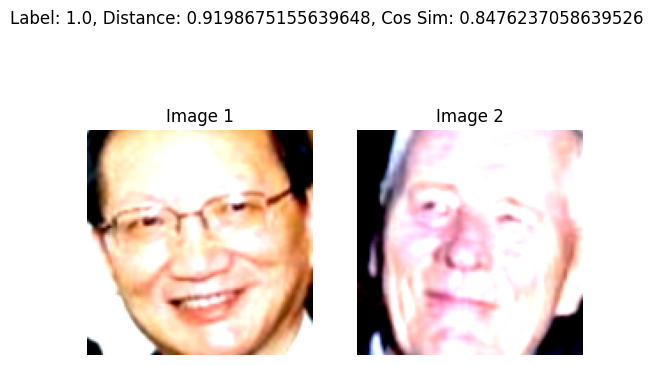

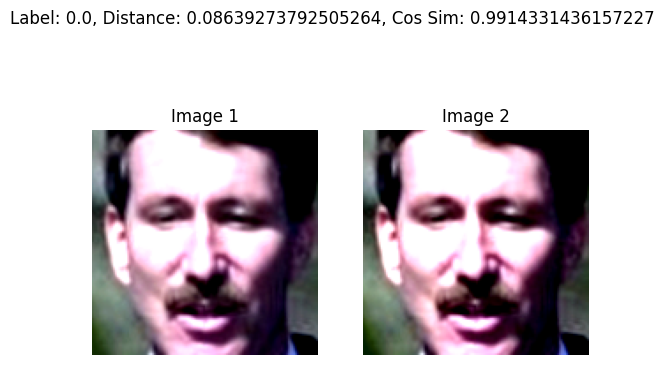

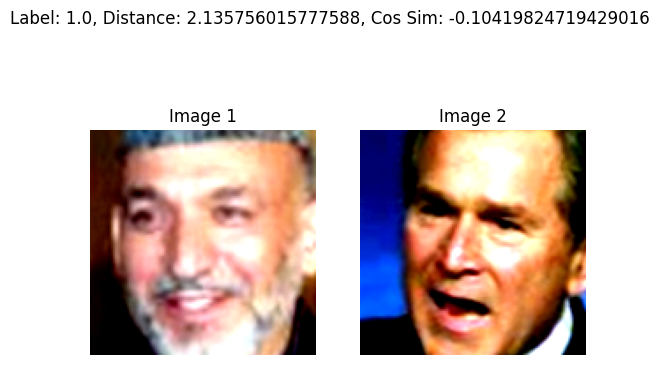

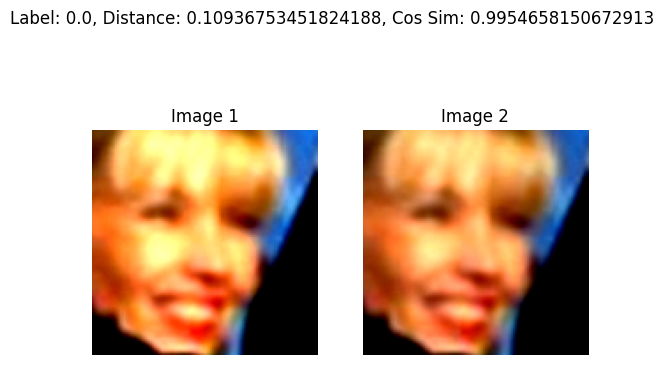

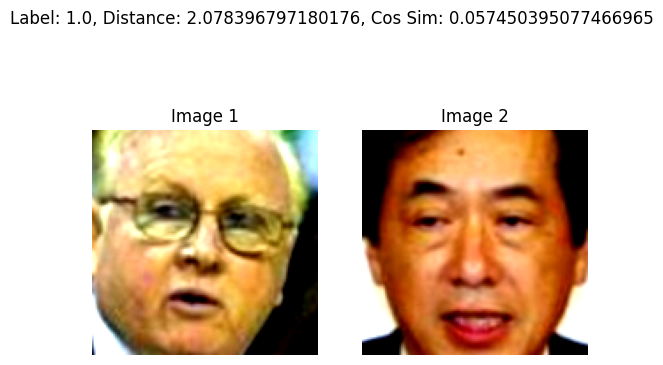

In [ ]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch, z_batch = batch[0], batch[1], batch[2]
    print(x_batch.shape, y_batch.shape, z_batch.shape)
    break

for i in range(x_batch.shape[0]):
    img1 = x_batch[i]  # First image in the pair
    img2 = y_batch[i]  # Second image in the pair
    label = z_batch[i].item()  # Label for the pair

    im1 = img1.unsqueeze(0)  # Add a batch dimension
    im2 = img2.unsqueeze(0)  # Add a batch dimension

    out1, out2=model(im1,im2)
    distance = F.pairwise_distance(out1, out2, keepdim = True)

    cos_similarity = F.cosine_similarity(out1, out2)
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(np.transpose(img1.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.transpose(img2.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 2")
    plt.axis('off')

    plt.suptitle(f"Label: {label}, Distance: {distance.item()}, Cos Sim: {cos_similarity.item()}")
    plt.show()


In [ ]:
# Lists to store validation loss and iteration numbers
val_loss_history = []
val_iteration_number = 0

# Set the model to evaluation mode
model.eval()

# Turn off gradient calculations
with torch.no_grad():
    for i, data in enumerate(val_loader, 0):
        img0, img1, label = data

        # Forward pass
        output1, output2 = model(img0, img1)

        # Calculate the loss
        loss_contrastive = criterion(output1, output2, label)

        print(f"Validation Batch number {i}, Current loss {loss_contrastive.item()}")

        val_iteration_number += 1
        val_loss_history.append(loss_contrastive.item())

Validation Batch number 0, Current loss 0.42897623777389526
Validation Batch number 1, Current loss 0.20579375326633453
Validation Batch number 2, Current loss 0.33288538455963135
Validation Batch number 3, Current loss 0.3505529463291168
Validation Batch number 4, Current loss 0.4649257957935333
Validation Batch number 5, Current loss 0.752544105052948
Validation Batch number 6, Current loss 0.6139063239097595
Validation Batch number 7, Current loss 0.3411150574684143
Validation Batch number 8, Current loss 0.4324917793273926
Validation Batch number 9, Current loss 0.45319226384162903
Validation Batch number 10, Current loss 0.3309924304485321
Validation Batch number 11, Current loss 0.9431332349777222
Validation Batch number 12, Current loss 0.8010767102241516
Validation Batch number 13, Current loss 0.6825851202011108
Validation Batch number 14, Current loss 0.2565537989139557
Validation Batch number 15, Current loss 0.3766750693321228
Validation Batch number 16, Current loss 0.5649

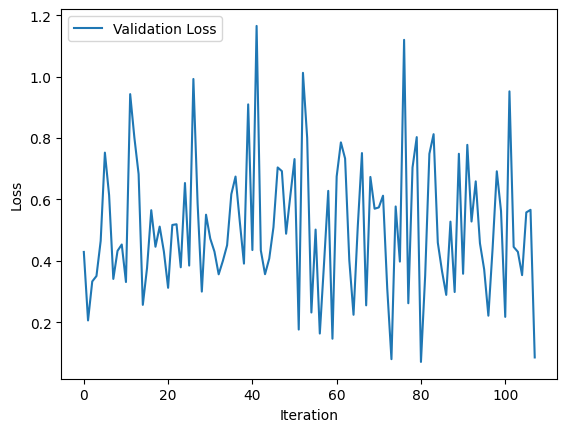

In [ ]:
plt.plot(range(len(val_loss_history)), val_loss_history, label='Validation Loss')
plt.legend()
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()

In [ ]:
# Validation loop
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    total_val_loss = 0
    for i, data in enumerate(val_loader, 0):
        img0, img1, label = data
        output1, output2 = model(img0, img1)
        loss_contrastive = criterion(output1, output2, label)

        total_val_loss += loss_contrastive.item()

    avg_val_loss = total_val_loss / len(val_loader)
    val_loss_history.append(avg_val_loss)

    print(f"Validation - Epoch {epoch}, Avg Loss: {avg_val_loss}")

Validation - Epoch 9, Avg Loss: 0.5470085802867457


torch.Size([16, 3, 128, 128]) torch.Size([16, 3, 128, 128]) torch.Size([16, 1])


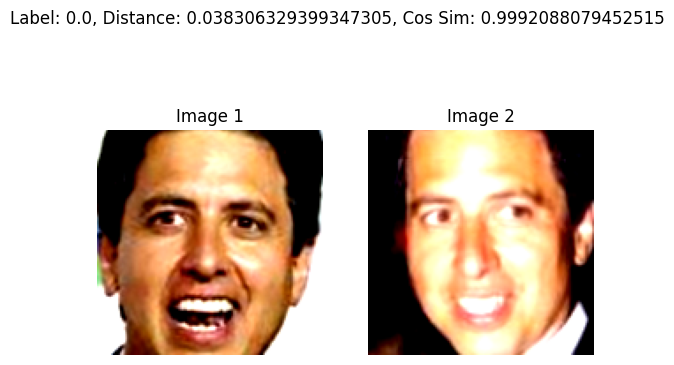

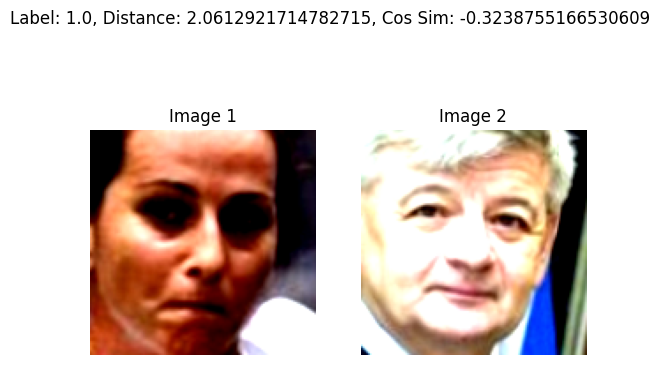

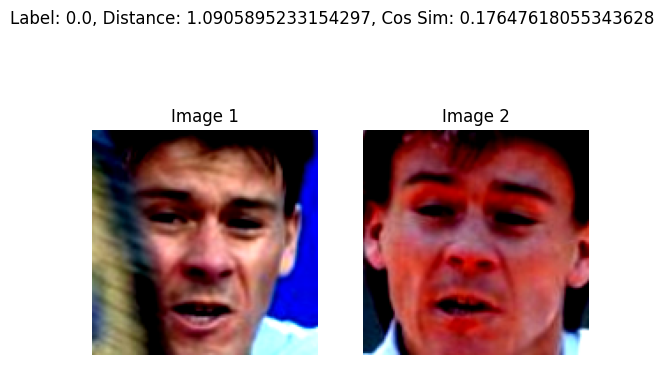

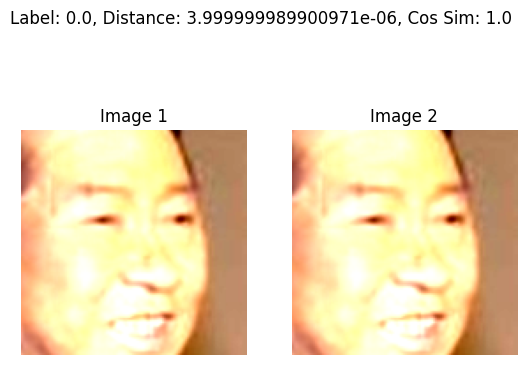

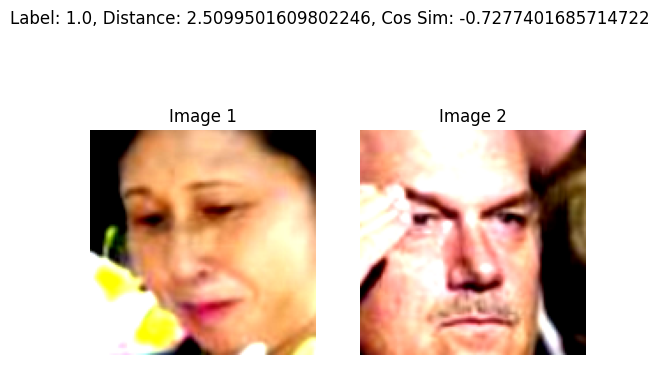

...

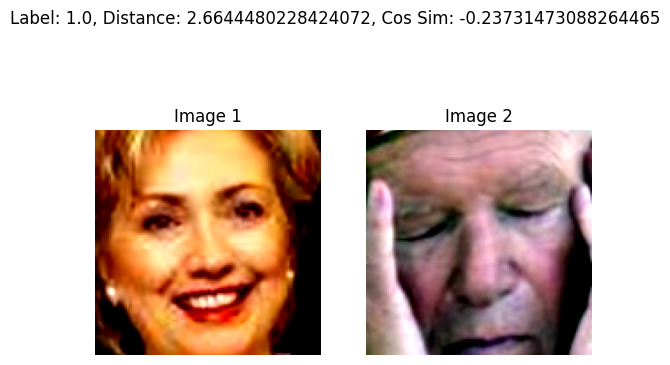

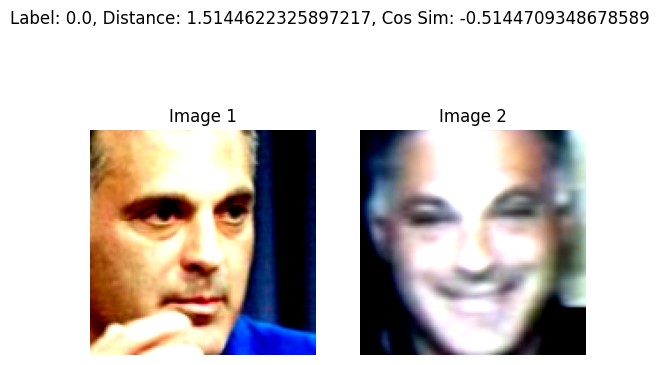

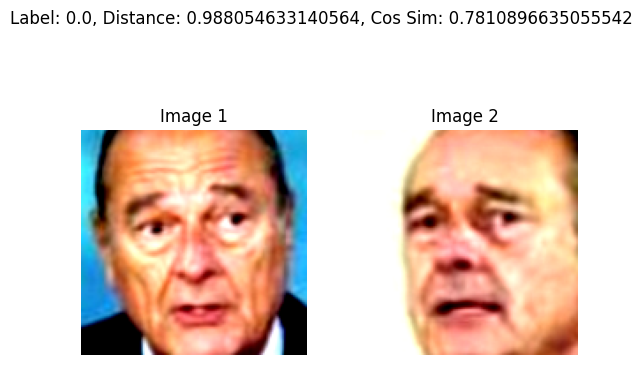

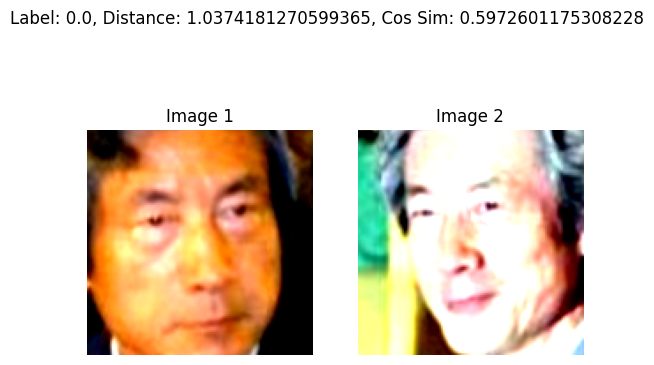

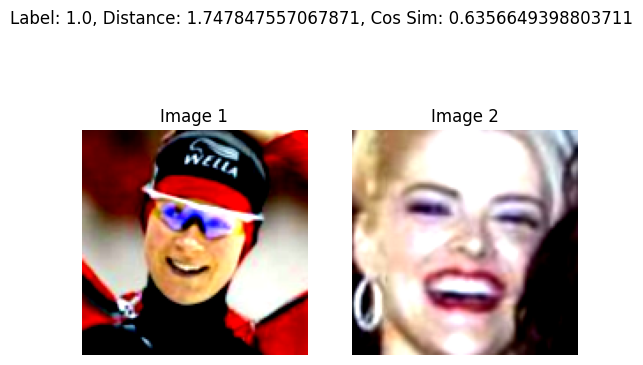

In [ ]:
for _, batch in enumerate(val_loader):
    x_batch, y_batch, z_batch = batch[0], batch[1], batch[2]
    print(x_batch.shape, y_batch.shape, z_batch.shape)
    break

for i in range(x_batch.shape[0]):
    img1 = x_batch[i]  # First image in the pair
    img2 = y_batch[i]  # Second image in the pair
    label = z_batch[i].item()  # Label for the pair

    im1 = img1.unsqueeze(0)  # Add a batch dimension
    im2 = img2.unsqueeze(0)  # Add a batch dimension

    out1, out2=model(im1,im2)
    distance = F.pairwise_distance(out1, out2, keepdim = True)

    cos_similarity = F.cosine_similarity(out1, out2)
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(np.transpose(img1.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.transpose(img2.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 2")
    plt.axis('off')

    plt.suptitle(f"Label: {label}, Distance: {distance.item()}, Cos Sim: {cos_similarity.item()}")
    plt.show()


As can be observed the distance between faces of the same individual is small and the cosine similarity is close to 1.

While as the distace between the faces of the diffenrt individuals is large and Cosine similarity is clsoe to 0.

In [ ]:
threshold = 0.8  # Define the threshold for cosine similarity

model.eval()  # Set the model to evaluation mode

correct_predictions = 0
total_pairs = 0

with torch.no_grad():
    for i, data in enumerate(val_loader, 0):
        img0, img1, label = data
        output1, output2 = model(img0, img1)

        # Calculate the cosine similarity between out1 and out2
        cos_sim = torch.abs(F.cosine_similarity(output1, output2))
        #print(cos_sim)
        # Convert cosine similarity to a binary prediction
        predictions = (cos_sim >= threshold).float()  # 0 if cos_sim >= threshold, 1 otherwise
        label = label.view_as(predictions)
#       print(predictions)
#        print(label)
        # Calculate accuracy
#        print(predictions == label)
        correct_predictions += (predictions == label).sum().item()
        total_pairs += len(label)

accuracy = correct_predictions / total_pairs
print(f"Val Accuracy: {accuracy * 100:.2f}%")

Val Accuracy: 74.38%


In [ ]:
#Test performance
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    total_test_loss = 0
    for i, data in enumerate(test_loader, 0):
        img0, img1, label = data
        output1, output2 = model(img0, img1)
        loss_contrastive = criterion(output1, output2, label)

        total_test_loss += loss_contrastive.item()

    avg_test_loss = total_test_loss / len(test_loader)

    print(f"Test after Epoch {epoch}, Avg Loss: {avg_test_loss}")

Test after Epoch 9, Avg Loss: 0.5903052637567285


torch.Size([16, 3, 128, 128]) torch.Size([16, 3, 128, 128]) torch.Size([16, 1])


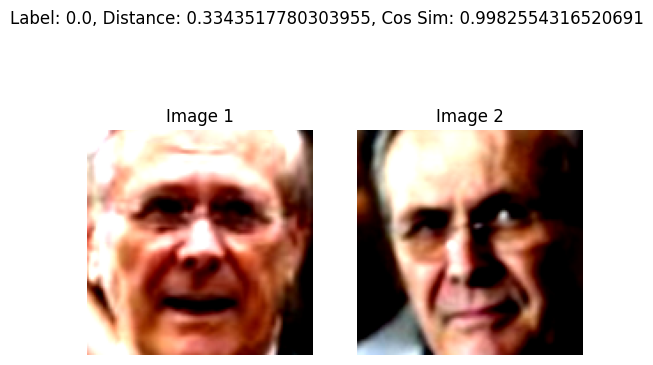

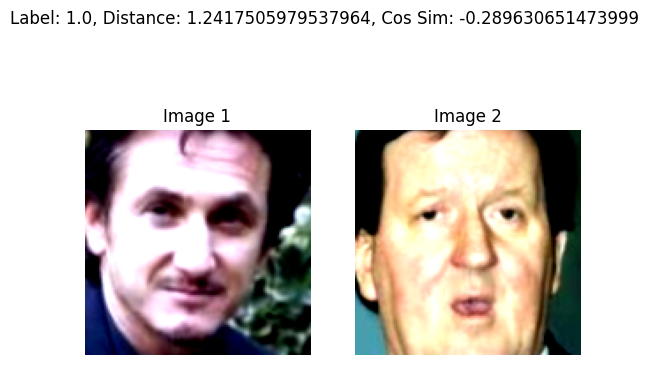

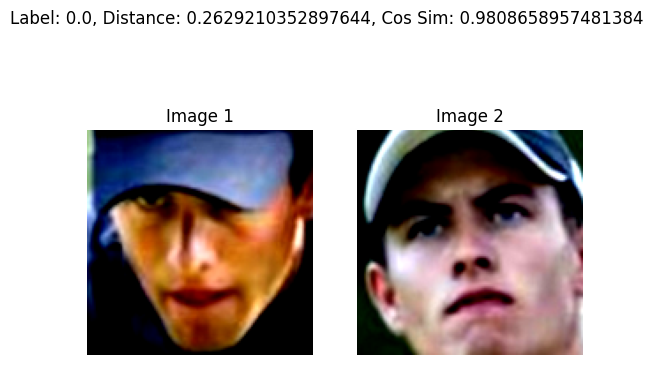

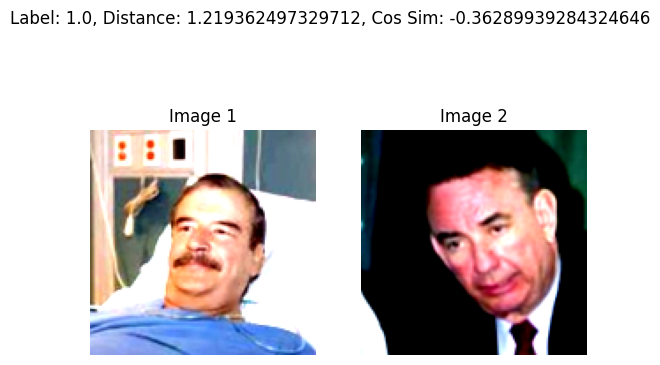

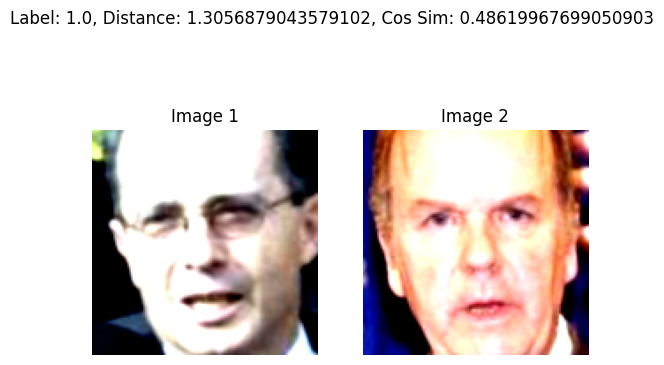

...

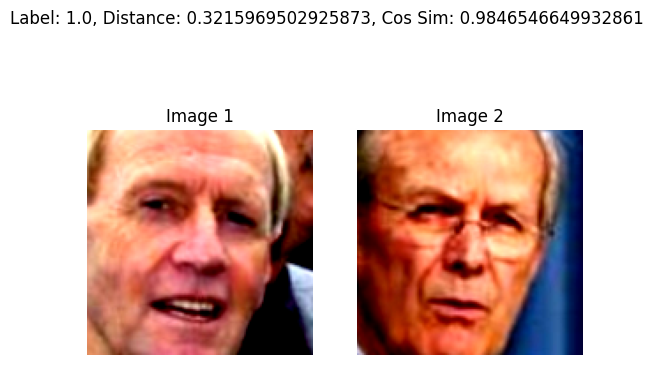

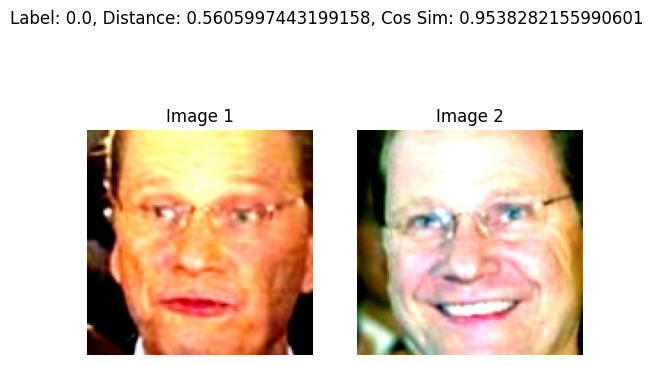

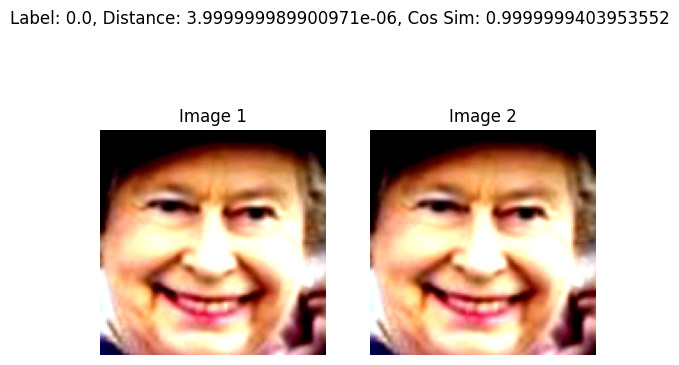

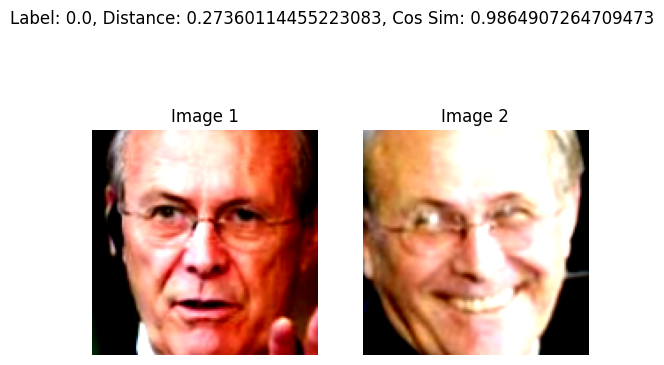

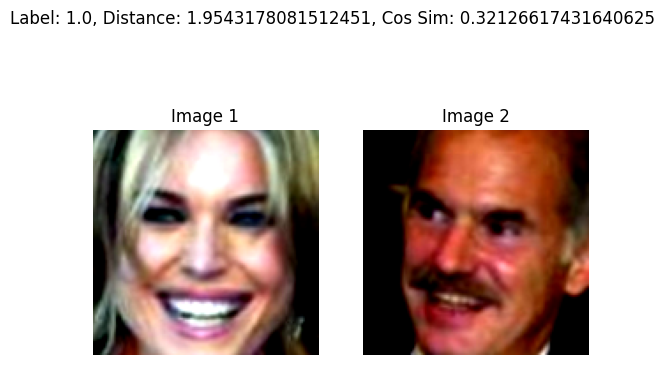

In [ ]:
for _, batch in enumerate(test_loader):
    x_batch, y_batch, z_batch = batch[0], batch[1], batch[2]
    print(x_batch.shape, y_batch.shape, z_batch.shape)
    break

for i in range(x_batch.shape[0]):
    img1 = x_batch[i]  # First image in the pair
    img2 = y_batch[i]  # Second image in the pair
    label = z_batch[i].item()  # Label for the pair

    im1 = img1.unsqueeze(0)  # Add a batch dimension
    im2 = img2.unsqueeze(0)  # Add a batch dimension

    out1, out2=model(im1,im2)
    distance = F.pairwise_distance(out1, out2, keepdim = True)

    cos_similarity = F.cosine_similarity(out1, out2)
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(np.transpose(img1.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.transpose(img2.numpy(), (1, 2, 0)) / 2 + 0.5)  # Convert image to the correct format
    plt.title("Image 2")
    plt.axis('off')

    plt.suptitle(f"Label: {label}, Distance: {distance.item()}, Cos Sim: {cos_similarity.item()}")
    plt.show()


In [ ]:
best_model_path = 'best_siamese_model_latest.pth'
# Load the best model
model.load_state_dict(torch.load(best_model_path))
print("Best model loaded.")

Best model loaded.


In [ ]:
threshold = 0.8  # Define the threshold for cosine similarity

model.eval()  # Set the model to evaluation mode

correct_predictions = 0
total_pairs = 0

with torch.no_grad():
    for i, data in enumerate(test_loader, 0):
        img0, img1, label = data
        output1, output2 = model(img0, img1)

        # Calculate the cosine similarity between out1 and out2
        cos_sim = torch.abs(F.cosine_similarity(output1, output2))
        #print(cos_sim)
        # Convert cosine similarity to a binary prediction
        predictions = (cos_sim <= threshold).float()  # 0 if cos_sim >= threshold, 1 otherwise
        label = label.view_as(predictions)
#       print(predictions)
#        print(label)
        # Calculate accuracy
#        print(predictions == label)
        correct_predictions += (predictions == label).sum().item()
        total_pairs += len(label)

accuracy = correct_predictions / total_pairs
print(f"Test Accuracy: {accuracy * 100:.2f}%")

Test Accuracy: 77.96%


In [ ]:
def visualize_image_similarity(image_path1, image_path2, model, label, transform):
    img1 = Image.open(image_path1).convert('RGB')
    img2 = Image.open(image_path2).convert('RGB')

    img1 = transform(img1).unsqueeze(0)
    img2 = transform(img2).unsqueeze(0)

    # code as above to comapre the images, now in a ficnitn fro repeafted calls
    output1, output2 = model(img1, img2)

    distance = torch.nn.functional.pairwise_distance(output1, output2, keepdim=True)
    cos_similarity = torch.nn.functional.cosine_similarity(output1, output2)

    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(img1.squeeze().numpy().transpose((1, 2, 0)) / 2 + 0.5)
    plt.title("Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img2.squeeze().numpy().transpose((1, 2, 0)) / 2 + 0.5)
    plt.title("Image 2")
    plt.axis('off')

    plt.suptitle(f"Label:{label:.4f},Distance: {distance.item():.4f}, Cosine Similarity: {cos_similarity.item():.4f}")
    plt.show()


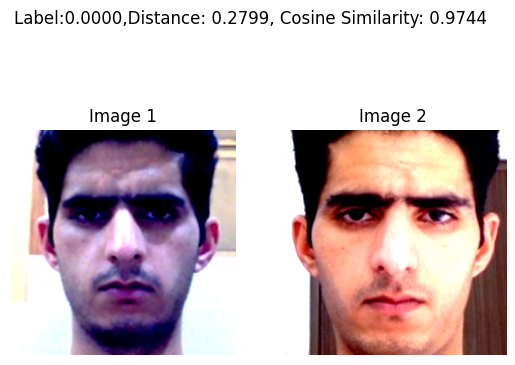

In [ ]:
# Example usage:
image_path1 = '/content/me1.jpg'
image_path2 = '/content/me2.jpg'
model.eval()
# Use predefined test transform
test_transform = data_transforms['test']
visualize_image_similarity(image_path1, image_path2, model, 0, test_transform)

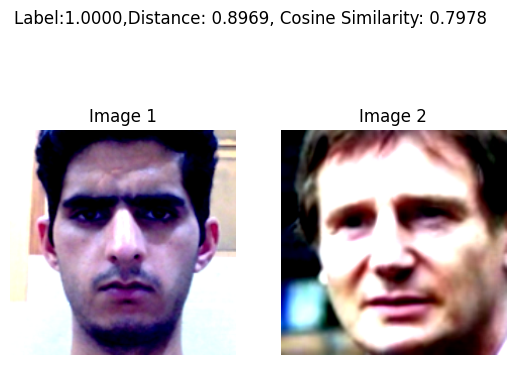

In [ ]:
# Example usage:
image_path1 = '/content/me1.jpg'
image_path2 = '/content/notme1.jpg'
model.eval()
# Use your predefined test transform
test_transform = data_transforms['test']
visualize_image_similarity(image_path1, image_path2, model, 1, test_transform)

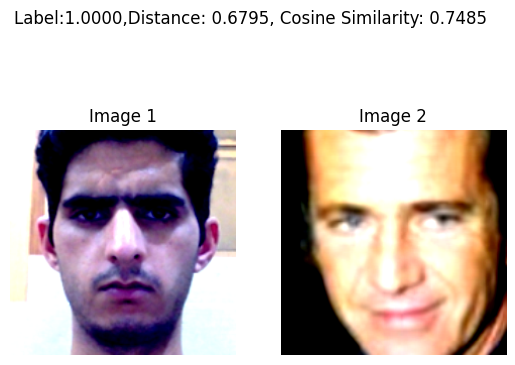

In [ ]:
# Example usage:
image_path1 = '/content/me1.jpg'
image_path2 = '/content/notme2.jpg'
model.eval()
# Use your predefined test transform
test_transform = data_transforms['test']
visualize_image_similarity(image_path1, image_path2, model, 1, test_transform)

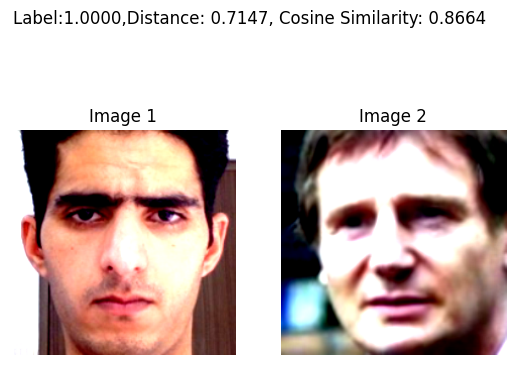

In [ ]:
# Example usage:
image_path1 = '/content/me2.jpg'
image_path2 = '/content/notme1.jpg'
model.eval()
# Use your predefined test transform
test_transform = data_transforms['test']
visualize_image_similarity(image_path1, image_path2, model, 1, test_transform)

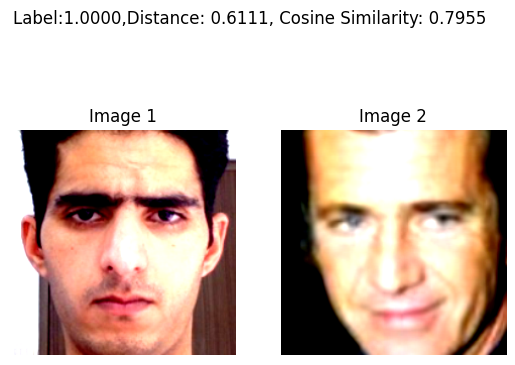

In [ ]:
# Example usage:
image_path1 = '/content/me2.jpg'
image_path2 = '/content/notme2.jpg'
model.eval()
# Use your predefined test transform
test_transform = data_transforms['test']
visualize_image_similarity(image_path1, image_path2, model, 1, test_transform)